# The Task
- Train a GAN

## Approach


```
for epoch in range(100):
  for batch in batches:
    fake_images = Generator(random_noise)
    true_images = loader()
    train_images = [fake_images, true_images]
    pred = Discriminator(train_images)
    Dicriminator.optimize()
    Qualität_fake = pred[:32]
    Generator.optimize() (Fake_labels:[1,1,1,1,1], Real_output: [0.2, 0.7, 0.4]
```



## Additional Tasks
- Transform the GAN to a Wasserstein GAN
- Transform the GAN to a Gradient Penalty GAN

In [18]:
import matplotlib.pyplot as plt
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import torchvision.utils as vutils
import matplotlib.animation as animation
from IPython.display import HTML
import random
manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)
import os
from shutil import copyfile
from pathlib import Path
import json
import zipfile

# Getting the data
https://www.analyticsvidhya.com/blog/2021/06/how-to-load-kaggle-datasets-directly-into-google-colab/

In [19]:
# Set the path for the kaggle api key
key_path = 'C:/Users/Daniel/Downloads/kaggle.json'

In [20]:
credentials = {"username":"", "key":""}

with open(key_path) as json_file:
    credentials = json.load(json_file)

os.environ['KAGGLE_USERNAME']=credentials["username"]
os.environ['KAGGLE_KEY']=credentials["key"]

### Import data and unzip

In [21]:
! kaggle datasets download -d splcher/animefacedataset -p kaggle_data
with zipfile.ZipFile("kaggle_data/animefacedataset.zip", 'r') as zip_ref:
  zip_ref.extractall('kaggle_data/anime')

animefacedataset.zip: Skipping, found more recently modified local copy (use --force to force download)


## Import libraries and create the dataloader

In [22]:
# Check for CUDA support
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')
print(torch.version.cuda)

Selected device: cuda
10.2


In [25]:
batch_size = 128
image_size = 64
workers = 2

transform = transforms.Compose([
                                transforms.Resize(image_size),
                                transforms.CenterCrop(image_size),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

path = "kaggle_data/anime"
folder = torchvision.datasets.ImageFolder(root=path, transform=transform)


dataLoader = DataLoader(folder, batch_size=batch_size, num_workers=workers)

# Show some images

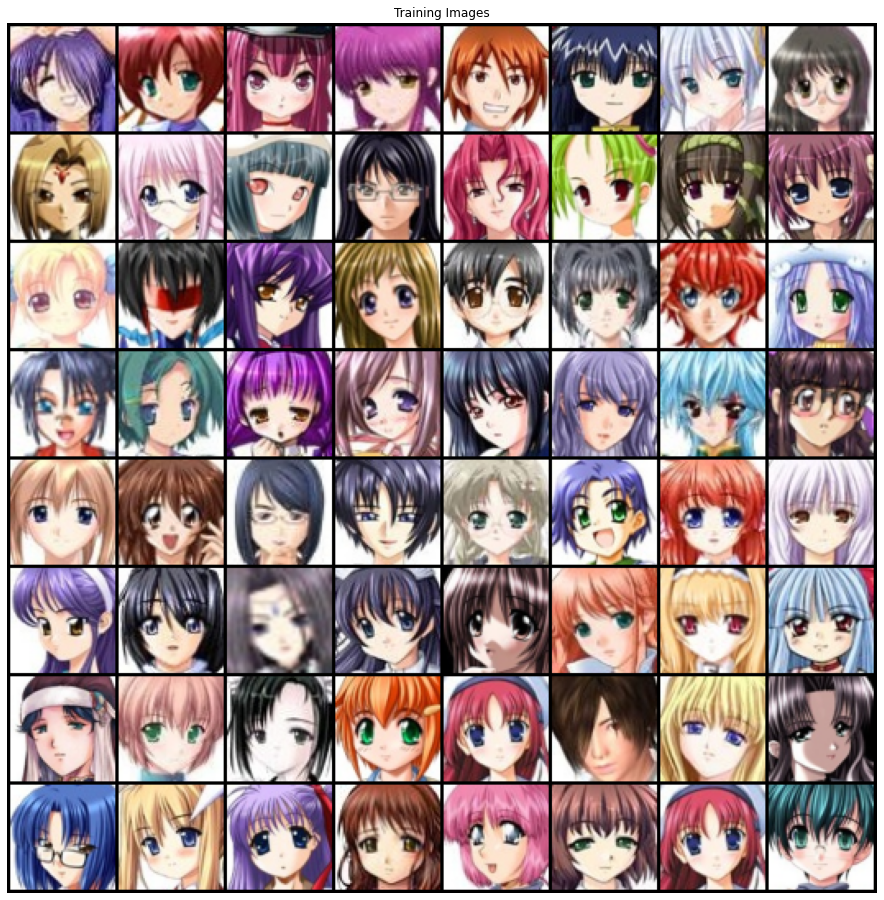

In [61]:
real_batch = next(iter(dataLoader))
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [26]:
# Automatic detection of channels
real_batch = next(iter(dataLoader))
image_channel = real_batch[0][0].shape[0]

# Input noise size for the generator
input_size_noise_generator = 128

# Transposing size of the generator
transpose_size_generator = image_size

# Convolution size of the discriminator
convolution_size_discriminator = image_size

# DCGAN
The DCGAN is a better approach to GANs than regular GANs with linear layers. The best practice is for:  
- Discriminator
  - Convolution
  - Batchnormlization
  - LeakyReLU
  - Sigmoid as output to get a result between 1 and 0
- Generator
  - Convultion Transpose -> Creates additional data points
  - Batchnormalization
  - ReLU
  - Tanh as output

### Documentation
- https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html  
- https://machinelearningmastery.com/how-to-train-stable-generative-adversarial-networks/

- https://arxiv.org/abs/1701.00160
  - Test Virtual Batch Normalizationc

In [35]:
class Generator(nn.Module):
    def __init__(self,):
      super(Generator, self).__init__()
      self.layers = nn.Sequential(
        nn.ConvTranspose2d( input_size_noise_generator, transpose_size_generator * 8, 4, 1, 0, bias=False),
        nn.BatchNorm2d(transpose_size_generator * 8),
        nn.ReLU(True),

        nn.ConvTranspose2d(transpose_size_generator * 8, transpose_size_generator * 4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(transpose_size_generator * 4),
        nn.ReLU(True),

        nn.ConvTranspose2d( transpose_size_generator * 4, transpose_size_generator * 2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(transpose_size_generator * 2),
        nn.ReLU(True),

        nn.ConvTranspose2d( transpose_size_generator * 2, transpose_size_generator, 4, 2, 1, bias=False),
        nn.BatchNorm2d(transpose_size_generator),
        nn.ReLU(True),

        nn.ConvTranspose2d( transpose_size_generator, image_channel, 4, 2, 1, bias=False),
        nn.Tanh()
      )

    def forward(self, x):
      return self.layers(x)

In [36]:
class Discriminator(nn.Module):
    def __init__(self,):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(image_channel, convolution_size_discriminator, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(convolution_size_discriminator, convolution_size_discriminator * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(convolution_size_discriminator * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(convolution_size_discriminator * 2, convolution_size_discriminator * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(convolution_size_discriminator * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(convolution_size_discriminator * 4, convolution_size_discriminator * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(convolution_size_discriminator * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(convolution_size_discriminator * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [38]:
loss_function = nn.BCELoss()

fixed_noise = torch.randn(64, input_size_noise_generator, 1, 1, device=device)

real_label = 1.0
fake_label = 0.0

discriminator = Discriminator()
discriminator.to(device)
generator = Generator()
generator.to(device)


lr_D = 0.0002
lr_G = 0.0002

# Setup SGD optimizers for both Generator and Discriminator
# optimizerD = optim.SGD(discriminator.parameters(), lr=lr_D)
# optimizerG = optim.SGD(generator.parameters(), lr=lr_G)

# Adam optimizers with the beta1 as suggested in papers
beta1 = 0.5

optimizerD = optim.Adam(discriminator.parameters(), lr=lr_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(generator.parameters(), lr=lr_G, betas=(beta1, 0.999))

img_list = []
G_error = []
D_error = []
iterations = 0
num_epochs = 5

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    errD_outside = []
    errG_outside = []
    for i, data in enumerate(dataLoader, 0):
####### Discriminator

        discriminator.zero_grad()

        real_data = data[0].to(device)

        data_size = real_data.size(0)
        
        label = torch.full((data_size,), real_label, device=device)

        output = discriminator(real_data).view(-1)

        errD_real = loss_function(output, label)

        errD_real.backward()

        noise = torch.randn(data_size, input_size_noise_generator, 1, 1, device=device)

        fake_data = generator(noise)
        label.fill_(fake_label)

        output = discriminator(fake_data.detach()).view(-1)

        errD_fake = loss_function(output, label)

        errD_fake.backward()

        errD = errD_real + errD_fake

        optimizerD.step()

####### Generator
        generator.zero_grad()
        label.fill_(real_label)

        output = discriminator(fake_data).view(-1)

        errG = loss_function(output, label)

        errG.backward()

        optimizerG.step()

        if i % 50 == 0:
            print('[%03d/%03d][%03d/%03d]\tDiscriminator_Loss: %.4f\tGenerator_Loss: %.4f'
                  % (epoch+1, num_epochs, i, len(dataLoader), errD.item(), errG.item()))


        errD_outside.append(errD.item())
        errG_outside.append(errG.item())
        
        if (iterations % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataLoader)-1)):
            with torch.no_grad():
                fake = generator(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iterations += 1
    D_error.append(np.mean(errD_outside))
    G_error.append(np.mean(errG_outside))

Starting Training Loop...
[001/005][000/497]	Discriminator_Loss: 1.4419	Generator_Loss: 2.5894


KeyboardInterrupt: 

In [41]:
print(D_error)

[0.662862343027798, 0.6517294065753219, 0.5411277436454531, 0.4234605023049013, 0.3707158201687053]


NameError: name 'G_error' is not defined

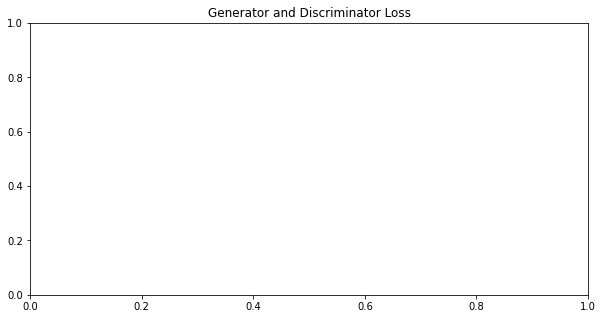

In [6]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss")
plt.plot(G_error,label="Generator")
plt.plot(D_error,label="Discriminator")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [ ]:
#%%capture
fig = plt.figure(figsize=(16,16))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

Output hidden; open in https://colab.research.google.com to view.

# Wasserstein Implementation
[Paper](https://arxiv.org/pdf/1701.07875.pdf)

### ToDos
- [ ] Take the mean of the errD for a better graph

In [27]:
class WGenerator(nn.Module):
    def __init__(self,):
      super().__init__()
      self.layers = nn.Sequential(

        # input is Z, going into a convolution
        nn.ConvTranspose2d( input_size_noise_generator, transpose_size_generator * 8, 4, 1, 0, bias=False),
        nn.BatchNorm2d(transpose_size_generator * 8),
        nn.ReLU(True),
        # state size. (transpose_size_generator*8) x 4 x 4
        nn.ConvTranspose2d(transpose_size_generator * 8, transpose_size_generator * 4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(transpose_size_generator * 4),
        nn.ReLU(True),
        # state size. (transpose_size_generator*4) x 8 x 8
        nn.ConvTranspose2d( transpose_size_generator * 4, transpose_size_generator * 2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(transpose_size_generator * 2),
        nn.ReLU(True),
        # state size. (transpose_size_generator*2) x 16 x 16
        nn.ConvTranspose2d( transpose_size_generator * 2, transpose_size_generator, 4, 2, 1, bias=False),
        nn.BatchNorm2d(transpose_size_generator),
        nn.ReLU(True),
        # state size. (transpose_size_generator) x 32 x 32
        nn.ConvTranspose2d( transpose_size_generator, image_channel, 4, 2, 1, bias=False),
        nn.Tanh()
        # state size. (nc) x 64 x 64
      )

    def forward(self, x):
      return self.layers(x)

In [28]:
class WDiscriminator(nn.Module):
    def __init__(self,):
        super().__init__()
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(image_channel, convolution_size_discriminator, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (convolution_size_discriminator) x 32 x 32
            nn.Conv2d(convolution_size_discriminator, convolution_size_discriminator * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(convolution_size_discriminator * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (convolution_size_discriminator*2) x 16 x 16
            nn.Conv2d(convolution_size_discriminator * 2, convolution_size_discriminator * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(convolution_size_discriminator * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (convolution_size_discriminator*4) x 8 x 8
            nn.Conv2d(convolution_size_discriminator * 4, convolution_size_discriminator * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(convolution_size_discriminator * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (convolution_size_discriminator*8) x 4 x 4
            nn.Conv2d(convolution_size_discriminator * 8, 1, 4, 1, 0, bias=False),
            nn.Linear(1,1)
        )

    def forward(self, input):
        return self.main(input)

In [29]:
def D_wasserstein_loss(fake, real):
  return -(torch.mean(real) - torch.mean(fake))

# Input from Discriminator fake labels
def G_wasserstein_loss(fake):
  return -torch.mean(fake)

### First try with D_wasserstein_loss and G_wasserstein_loss

In [39]:
fixed_noise = torch.randn(64, input_size_noise_generator, 1, 1, device=device)

real_label = -1.0
fake_label = 1.0

discriminator = WDiscriminator()
generator = WGenerator()
generator.to(device)
discriminator.to(device)

# Learning rate as described in the paper
lr = 0.00005

# RMSprop is the proposed optimizer in the paper
optimizerD = optim.RMSprop(discriminator.parameters(), lr=lr)
optimizerG = optim.RMSprop(generator.parameters(), lr=lr)

# Lists to keep track of progress
img_list = []
G_error = []
D_error = []
iterations = 0
num_epochs = 5
num_discriminator = 5

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    errD_outside = []
    errG_outside = []
    for i, data in enumerate(dataLoader, 0):
        for _ in range(num_discriminator):

          discriminator.zero_grad()
          real_data = data[0].to(device)
          data_size = real_data.size(0)
          label = torch.full((data_size,), real_label, device=device)
          output_real = discriminator(real_data).view(-1)

          noise = torch.randn(data_size, input_size_noise_generator, 1, 1, device=device)
          fake_data = generator(noise)
          label.fill_(fake_label)
          output_fake = discriminator(fake_data.detach()).view(-1)

          errD = D_wasserstein_loss(output_fake, output_real)
          errD.backward()

          optimizerD.step()
          for p in discriminator.parameters():
            p.data.clamp_(-0.01, 0.01)


        generator.zero_grad()
        label.fill_(real_label)
        output = discriminator(fake_data).view(-1)

        errG = G_wasserstein_loss(output)
        errG.backward()

        optimizerG.step()

        if i % 50 == 0:
            print('[%03d/%03d][%03d/%03d]\Critic_Loss: %.4f\tGenerator_Loss: %.4f'
                  % (epoch+1, num_epochs, i, len(dataLoader), errD.item(), errG.item()))

        errD_outside.append(errD.item())
        errG_outside.append(errG.item())

        if (iterations % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataLoader)-1)):
            with torch.no_grad():
                fake = generator(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iterations += 1
    D_error.append(np.mean(errD_outside))
    G_error.append(np.mean(errG_outside))

Starting Training Loop...
[001/005][000/497]\Critic_Loss: -0.0005	Generator_Loss: 0.0102


KeyboardInterrupt: 

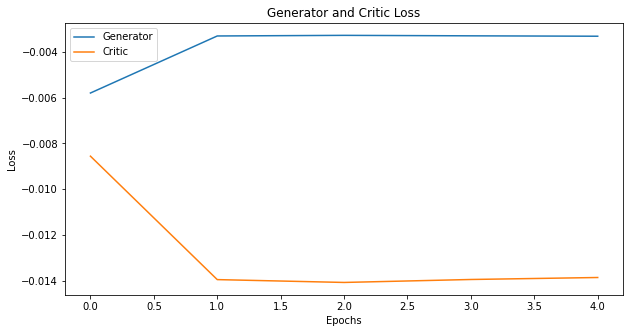

In [32]:
plt.figure(figsize=(10,5))
plt.title("Generator and Critic Loss")
plt.plot(G_error,label="Generator")
plt.plot(D_error,label="Critic")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

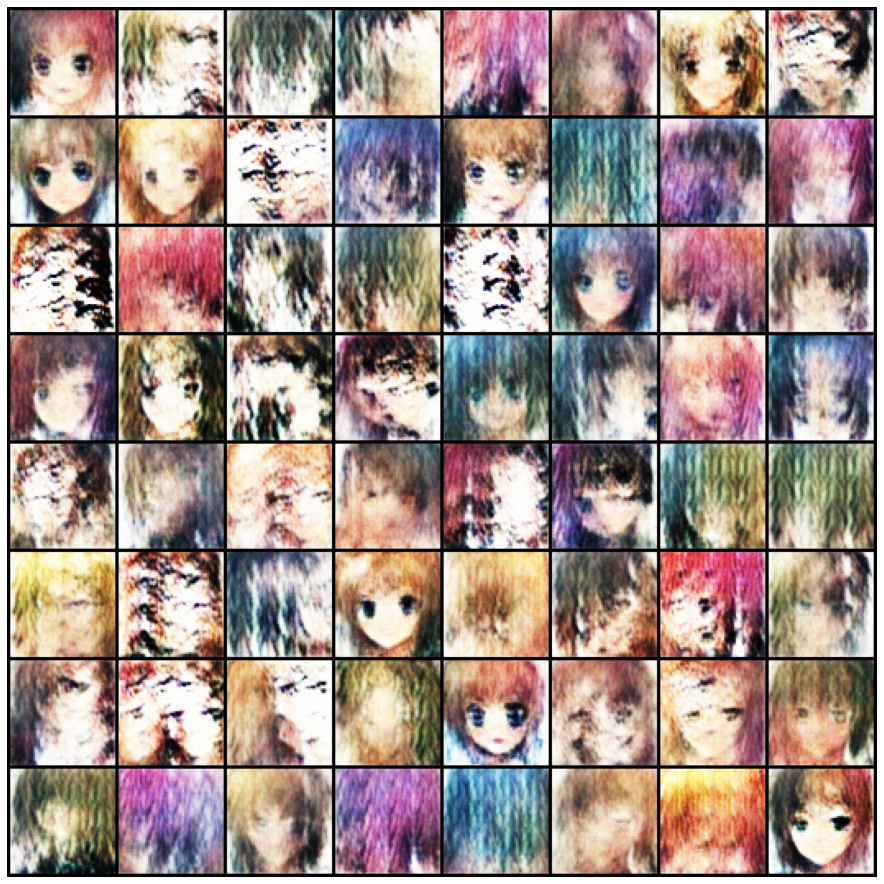

In [33]:
#%%capture
fig = plt.figure(figsize=(16,16))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

# Gradient Penalty GAN